# Basic features and XGBoost

* Default parameters for multinomial naive bayes
* No cross validation, no hyper parameters
* train is done on rebalanced data (distribution of is_duplicate is not the same on train(37%) and challenge data (17%) !)

A set of basic features are added to training
* Compute common_words between question1 & question2
* Compute Nb common_words between question1 & question2
* Compute Nb common words/nb words in question1
* Compute Nb common words/nb words in question2
* Compute Nb words in question1,question2 not in common words
* Compute (nb common words)/(nb words in question1+nb word in question2)
These features are combined to study 255 models

# Sequence
* All features are generated
    * on training data
    * on challenge data (overkill as some features may be rejected later but easier)
* AUCs and distribution graphs are computed for each single feature, hoping we can visually see if it is potentially useful or obviously useless
* not used yet but we do some other univaried stuff
* A XGBoost model is trained on ALL features
    * on a a partition train+validation=80 test=20
* Performances of all models are saved in a excel file
    * logloss (test)
    * accuracy (test)
    * score (weighted combination of f1-score) (test)
* Apply is done with this model 
    * proba is generated in a csv
    * csv is zipped
    * command line to publish in kaggle is displayed (no automatic submission to keep control)
* Kaggle performances are downloaded and saved
* Quality of this first model is challenged
    * Good accuracy but bad confusion matrix !
    * we need to calibrate the model (actually, this will be done later)



In [2]:
# Ugly incantation to make our 'framework' working
import sys
sys.path.insert(0, r'/SAPDevelop/QuoraPairs/BruteForce/Tools')

#import all our small tools (paths, cache, print,zip,excel, pandas, progress,..)
from Tools.all import *

# setup the name of our experiment
# it will be used to store every result in a unique place
EXPERIMENT='xgboost_basic_features'
# Do a bit of checks before actually running long code
UNITARY_TEST = True
print_alert('You will use environment %s' % EXPERIMENT)

prepare_environnement(EXPERIMENT)
train_dataframe=load_dataframe(CLEAN_TRAINING_DATA)
challenge_dataframe=load_dataframe(CLEAN_CHALLENGE_DATA)
print_section('Untouched input data has been loaded. Training: %d lines Challenge: %d lines' % (len(train_dataframe),len(challenge_dataframe)))


## Challenge and training are not equivalent

% of duplicate in training is not the same in challenge !
We don't have the challenge's answer but by scoring a constant prediction and using logloss definition, we can guess the distribution of duplicates in challenge

It's 17.46 %

To fix that we can:

* duplicate some negative cases in training to match challenge distribution
* use weights : each case has a weight !=1 and all algorithms are supposed to be able to deal with that info
I choose to use weights (less memory needed ?)

In [3]:
# return the weight for 0 and weight for 1 needed to rebalance dataframe like challenge
def balanced_weights(dataframe,expected_positive_ratio):
    current_positive_ratio = dataframe['is_duplicate'].sum()/len(dataframe)
    weight_for_negative = (1-expected_positive_ratio)/(1-current_positive_ratio)
    weight_for_positive = expected_positive_ratio/current_positive_ratio
    return weight_for_positive,weight_for_negative
    return 1,


CHALLENGE_DUPLICATE_PERCENT = 0.1746
print_warning('OUPS !! %% of duplicates in train is %.3f. In challenge it is %.3f %%' % (train_dataframe['is_duplicate'].sum()/len(train_dataframe),CHALLENGE_DUPLICATE_PERCENT))

# create a new 'weight' column to training dataset
# Do not forget to remove this column from features !!!
print_warning("let's add some weights to rebalance the data")
weight_for_1,weight_for_0 = balanced_weights(train_dataframe,CHALLENGE_DUPLICATE_PERCENT)
print_info('Weight for positive case %.3f' % weight_for_1)
print_info('Weight for negative case %.3f' % weight_for_0)
train_dataframe['weight'] = train_dataframe['is_duplicate'].map( {0:weight_for_0, 1:weight_for_1})

assert int(train_dataframe['weight'].sum()/len(train_dataframe)) == 1, "training dataset has not been properly rebalanced"
print_info("Training data set has been properly rebalanced")
print_info('Weights distribution:')
train_dataframe['weight'].describe()

count    404290.000000
mean          1.000000
std           0.403239
min           0.472917
25%           0.472917
50%           1.308493
75%           1.308493
max           1.308493
Name: weight, dtype: float64

In [4]:
def add_column_from_columns(dataframe,output_column_name,function):
    dataframe[output_column_name]=dataframe.progress_apply(function,axis=1)
    return dataframe[output_column_name]

def add_column_from_column(dataframe,output_column_name,input_column_name,function):
    dataframe[output_column_name]=dataframe[input_column_name].progress_apply(function)
    return dataframe[output_column_name]


def build_all_simple_features(dataframe):
    start_small()
    print_warning('Compute common_words between question1 & question2')
    add_column_from_column(dataframe,'nb_words_question1','question1',lambda x: len(x.split()))
    add_column_from_column(dataframe,'nb_words_question2','question2',lambda x: len(x.split()))
    print_warning('Compute Nb common_words between question1 & question2')
    add_column_from_columns(dataframe,'common_words',lambda r: list(set(r.question1.split())&set(r.question2.split())))
    add_column_from_column(dataframe,'nb_common_words','common_words',len)

    print_warning('Compute Nb common words/nb words in question1')
    add_column_from_columns(dataframe,'nb_common_words/nb_words_question1',lambda r: r.nb_common_words/max(1,r.nb_words_question1))
    print_warning('Compute Nb common words/nb words in question2')
    add_column_from_columns(dataframe,'nb_common_words/nb_words_question2',lambda r: r.nb_common_words/max(1,r.nb_words_question2))

    print_warning('Compute Nb words in question1,question2 not in common words')
    add_column_from_columns(dataframe,'nb_words_question1-common_words',lambda r: len(list(set(r.question1.split())-set(r.common_words))))
    add_column_from_columns(dataframe,'nb_words_question2-common_words',lambda r: len(list(set(r.question2.split())-set(r.common_words))))
    print_warning('Compute (nb common words)/(nb words in question1+nb word in question2)')
    add_column_from_columns(dataframe,'nb_common_words/(nb_words_question1+nb_words_question2)',lambda r: r.nb_common_words/(r.nb_words_question1+r.nb_words_question2))
    end_small()
    dataframe=dataframe.drop(columns='common_words')
    return dataframe

# Ready to start

Old code from my first days with python. Nonw, I know how to do that ways faster ... 

In [5]:
train_dataframe=load_or_build_dataframe('Training data + basic features','training_basic_features',build_all_simple_features,train_dataframe)
challenge_dataframe=load_or_build_dataframe('Challenge data + basic features','challenge_basic_features',build_all_simple_features,challenge_dataframe)

In [6]:
print_section('Train')
display(train_dataframe.head().transpose())
print_section('Challenge')
challenge_dataframe.head().transpose()

,0,1,2,3,4
id,0,1,2,3,4
qid1,1,3,5,7,9
qid2,2,4,6,8,10
question1,What is the step by step guide to invest in share market in india?,What is the story of Kohinoor (Koh-i-Noor) Diamond?,How can I increase the speed of my internet connection while using a VPN?,Why am I mentally very lonely? How can I solve it?,"Which one dissolve in water quikly sugar, salt, methane and carbon di oxide?"
question2,What is the step by step guide to invest in share market?,What would happen if the Indian government stole the Kohinoor (Koh-i-Noor) diamond back?,How can Internet speed be increased by hacking through DNS?,"Find the remainder when [math]23^{24}[/math] is divided by 24,23?",Which fish would survive in salt water?
is_duplicate,0,0,0,0,0
weight,1.30849,1.30849,1.30849,1.30849,1.30849
nb_words_question1,14,8,14,11,13
nb_words_question2,12,13,10,9,7
nb_common_words,10,4,3,0,2


,0,1,2,3,4
test_id,0,1,2,3,4
question1,How does the Surface Pro himself 4 compare with iPad Pro?,Should I have a hair transplant at age 24? How much would it cost?,What but is the best way to send money from China to the US?,Which food not emulsifiers?,"How ""aberystwyth"" start reading?"
question2,Why did Microsoft choose core m3 and not core i3 home Surface Pro 4?,How much cost does hair transplant require?,What you send money to China?,What foods fibre?,How their can I start reading?
nb_words_question1,11,14,14,4,4
nb_words_question2,14,7,6,3,6
nb_common_words,2,4,4,0,3
nb_common_words/nb_words_question1,0.181818,0.285714,0.285714,0,0.75
nb_common_words/nb_words_question2,0.142857,0.571429,0.666667,0,0.5
nb_words_question1-common_words,9,10,8,4,1
nb_words_question2-common_words,11,3,2,3,3


## Compute AUC of these basic features and try to figure if there is a bit of information inside each one
ie is it helping to separate 1 from 0?

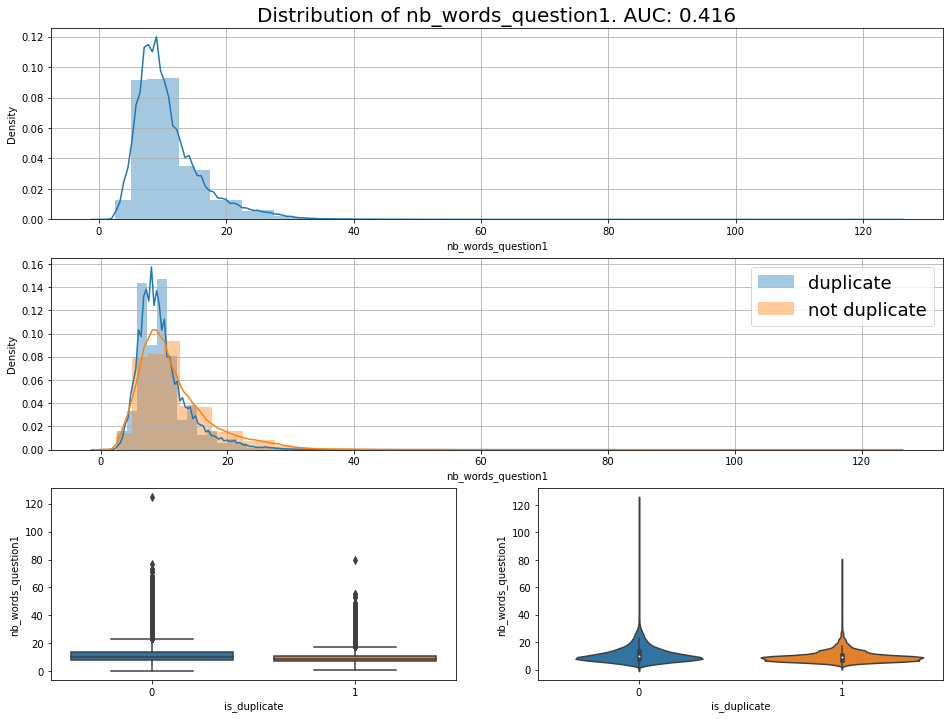

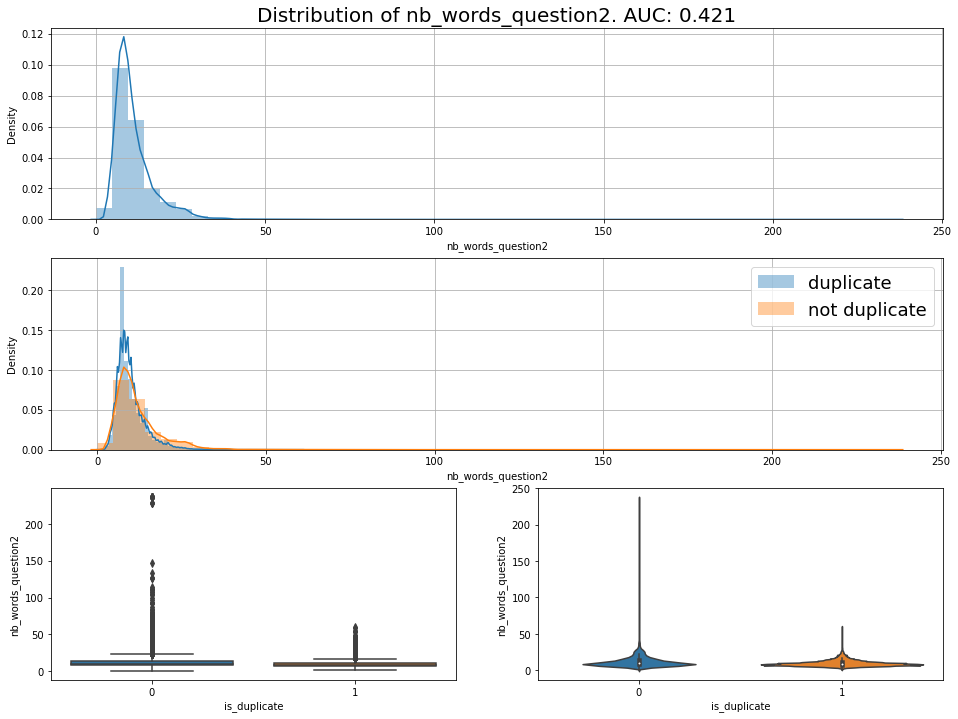

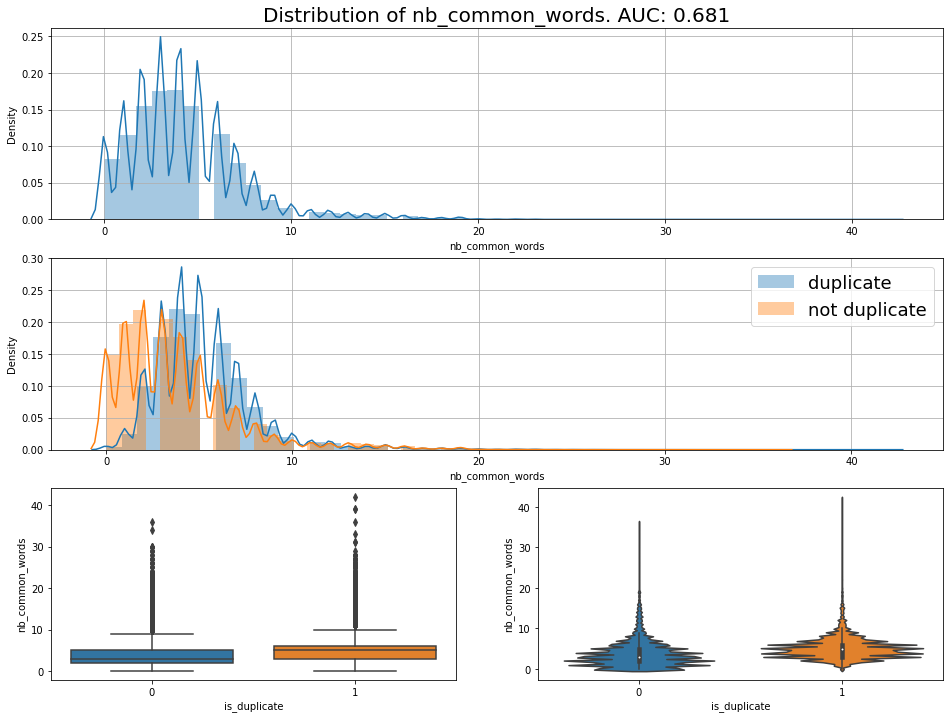

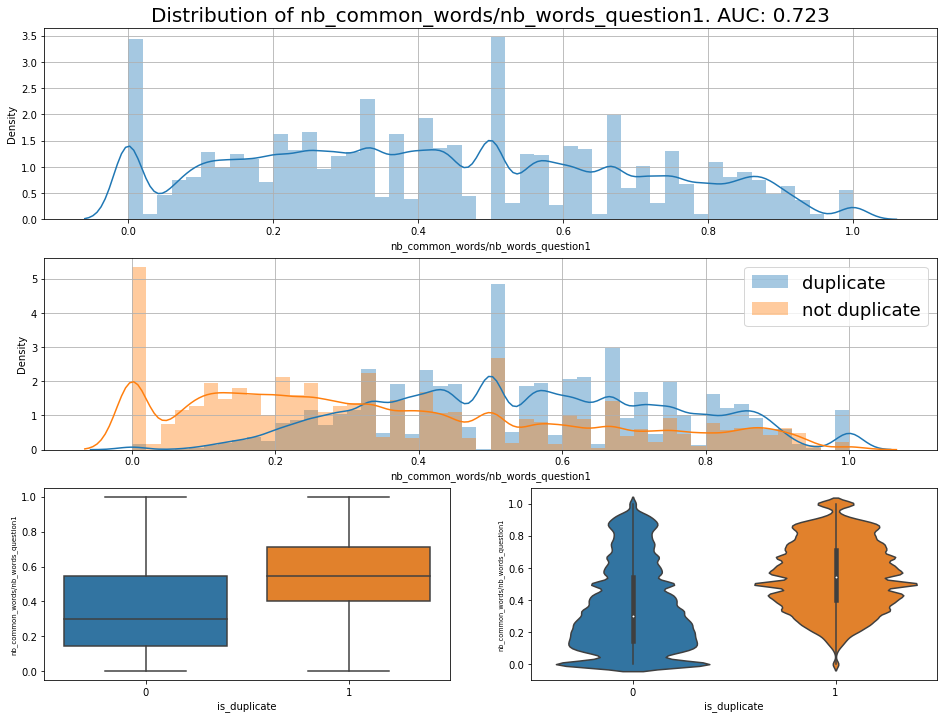

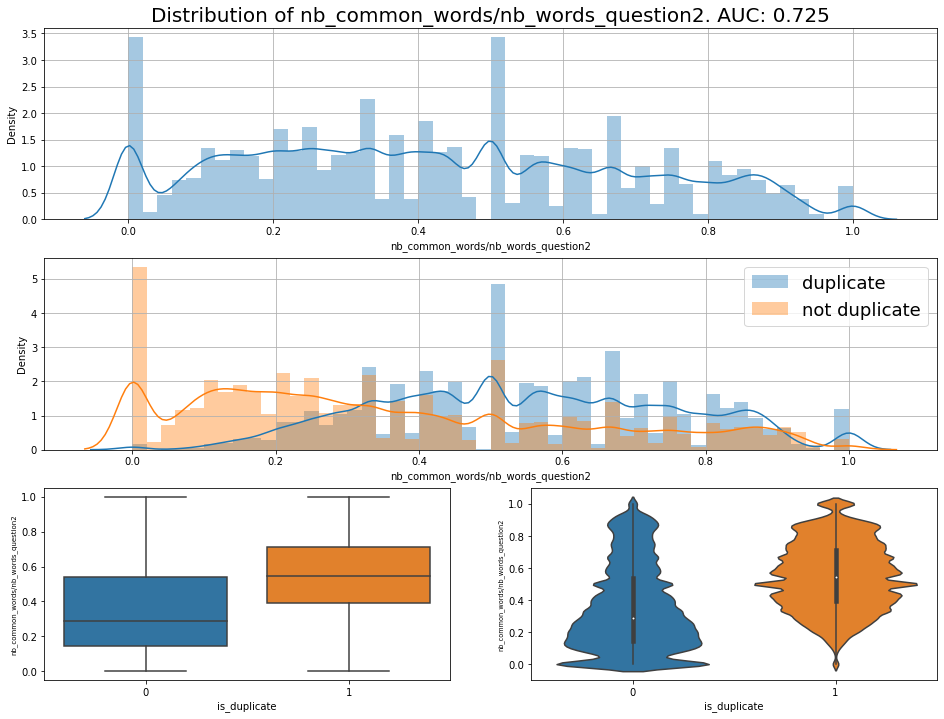

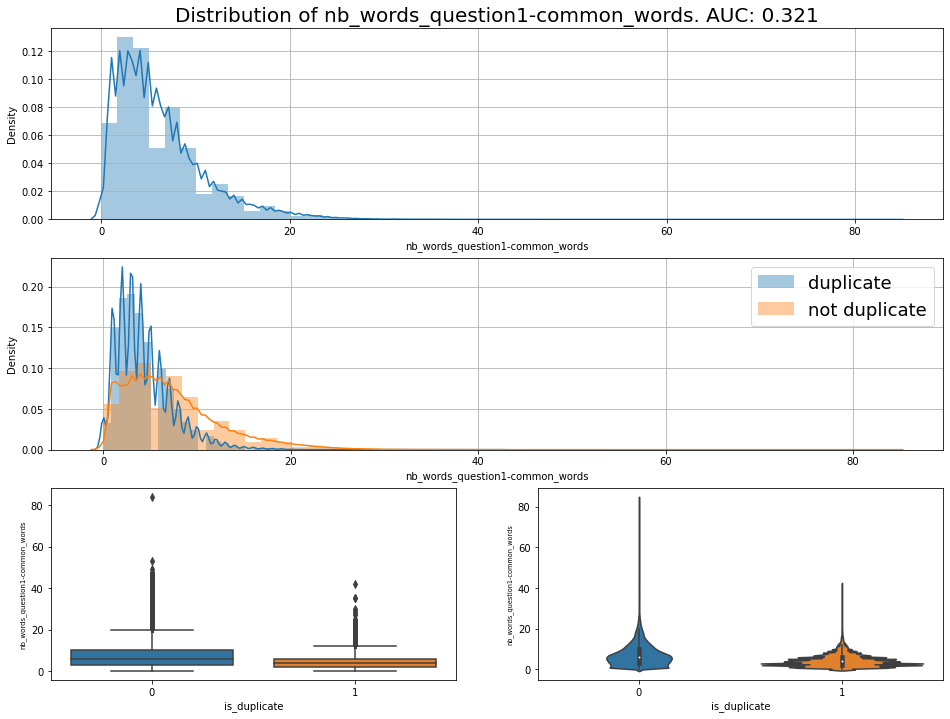

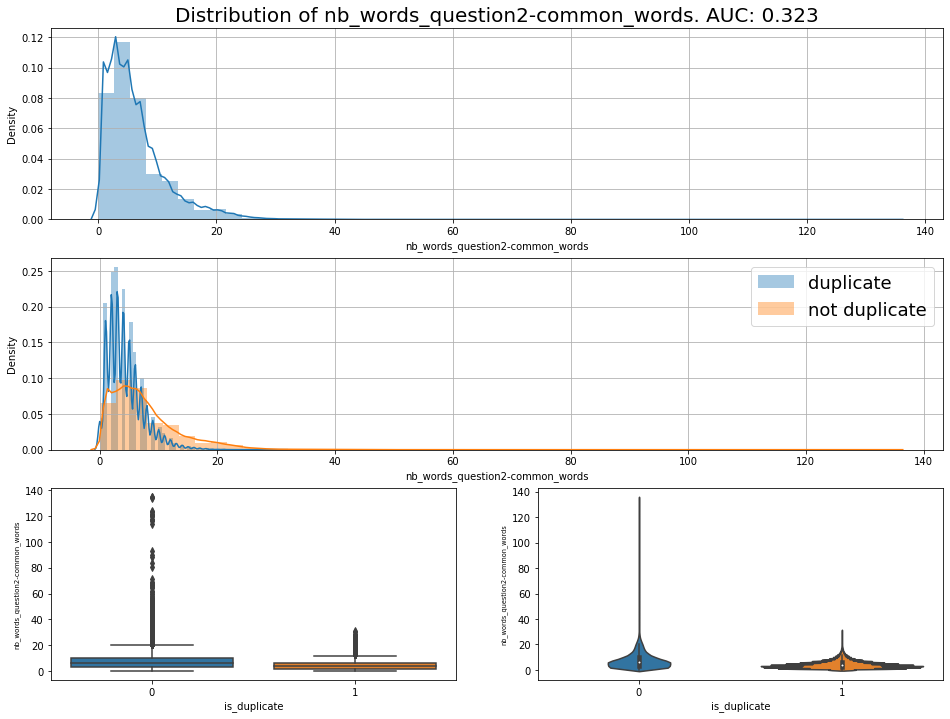

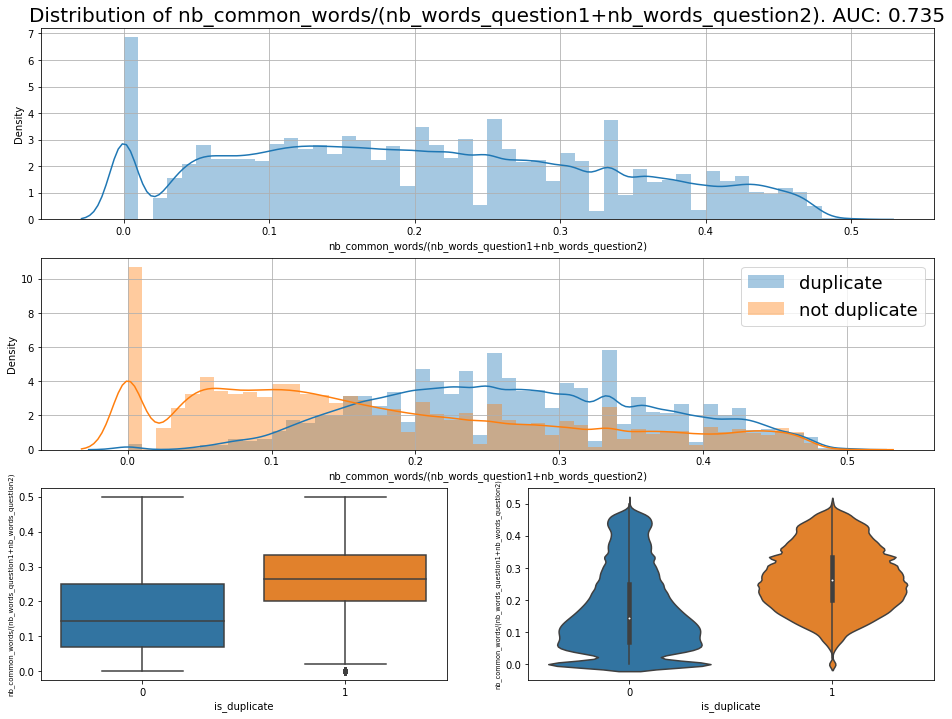

In [7]:
from sklearn.metrics import roc_auc_score


def simple_AUC(dataframe,column_name):
    return roc_auc_score(y_true=dataframe['is_duplicate'],y_score=dataframe[column_name])

def simple_weighted_AUC(dataframe,column_name):
    return roc_auc_score(y_true=dataframe['is_duplicate'],y_score=dataframe[column_name],sample_weight=dataframe['weight'])

def show_AUC(dataframe,column_name):
    if 'weight' in dataframe.columns:
        print_bullet('AUC (with weight) %s %f' % (column_name,simple_weighted_AUC(dataframe,column_name)))
    else:
        print_bullet('AUC %s: %f' % (column_name,simple_AUC(dataframe,column_name)))
        

def display_simple_AUC_exp(dataframe,column_name,nb_bins=50):
    palette = sns.color_palette()
    plot.figure(figsize=(10, 10))
    plot.hist(dataframe[column_name][dataframe['is_duplicate']==1],bins=nb_bins,color=palette[3],label='Same',histtype='step')
    plot.hist(train_dataframe[column_name][dataframe['is_duplicate']==0],bins=nb_bins,color=palette[2],label='Different',alpha = 0.75,histtype='step')
    plot.title('Distribution %s : %f' % (column_name,simple_AUC(dataframe,column_name)) , fontsize=10)
    plot.xlabel(column_name)
    plot.grid(True)
    plot.ylabel('Nb')
    plot.legend()


## display tons of infos about column_name and its relation with target
def display_simple_AUC(dataframe, column_name,nb_bins=50):
    fig = plot.figure(figsize=(16, 12))
    ax1 = plot.subplot2grid((3, 2), (0, 0), colspan=2)
    ax2 = plot.subplot2grid((3, 2), (1, 0), colspan=2)
    ax3 = plot.subplot2grid((3, 2), (2, 0))
    ax4 = plot.subplot2grid((3, 2), (2, 1))
    ax1.set_title('Distribution of %s. AUC: %.3f' % (column_name,simple_weighted_AUC(dataframe,column_name)), fontsize=20)
    sns.distplot(dataframe[column_name], bins=nb_bins, ax=ax1)  
    ax1.grid(True)
    sns.distplot(dataframe[dataframe['is_duplicate']==1][column_name], ax=ax2, label='duplicate', kde=True)    
    sns.distplot(dataframe[dataframe['is_duplicate']==0][column_name], bins=nb_bins,  ax=ax2, label='not duplicate', kde=True)
    ax2.grid(True)
    ax2.legend(loc='upper right', prop={'size': 18})
    sns.boxplot(y=column_name, x='is_duplicate', data=dataframe, ax=ax3)
    # we have some VERYYYY long variable names
    if len(column_name)>30:
        ax3.set_ylabel(column_name,fontsize=7)
    sns.violinplot(y=column_name,  x='is_duplicate',  data=dataframe,  ax=ax4)
    if len(column_name)>30:
        ax4.set_ylabel(column_name,fontsize=6.5)
    plot_save('distrib_'+column_name.replace('/','_div_').replace(' ','_'))
    plot.show()


def show_all_simple_AUC(dataframe):
    all =  all_numeric_columns(dataframe)
    print_section( 'Show AUC on %s unique features' % str(all))
    for name in all:
        show_AUC(dataframe,name)
    print()
    # show that smart graphs about column_name
    for name in all:
        show_AUC(dataframe,name)
        display_simple_AUC(dataframe,name,50)
    print_done('Done')



show_all_simple_AUC(train_dataframe)

Almost same graphs but using a cool library able to do an advanced automatic binning 

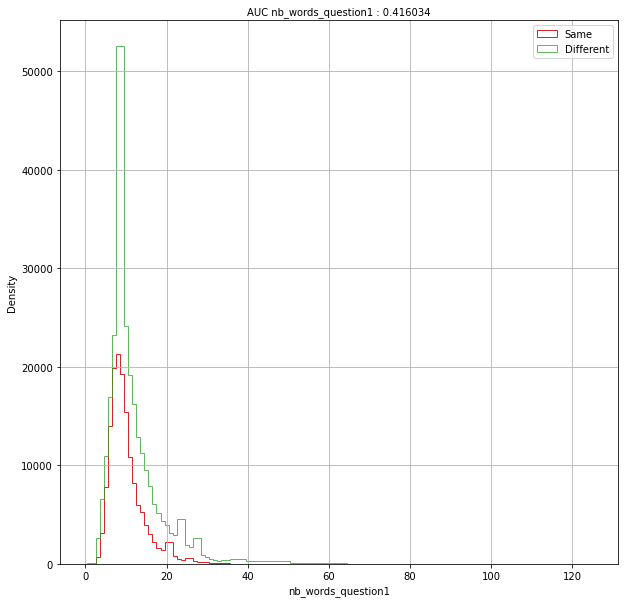

<Figure size 432x288 with 0 Axes>

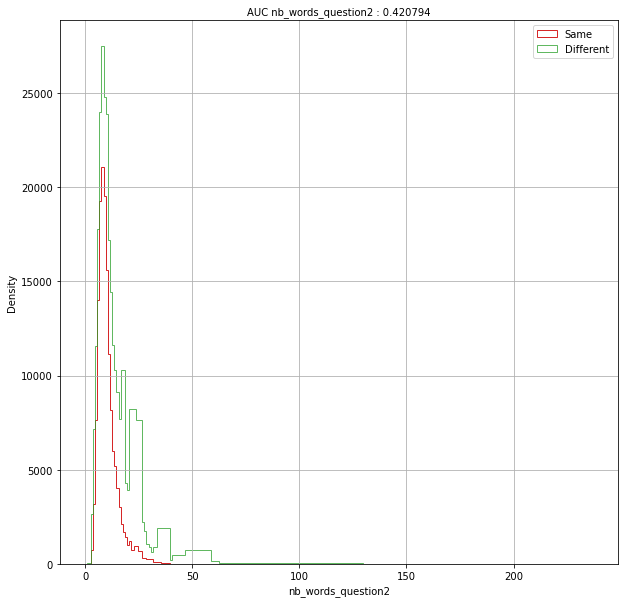

<Figure size 432x288 with 0 Axes>

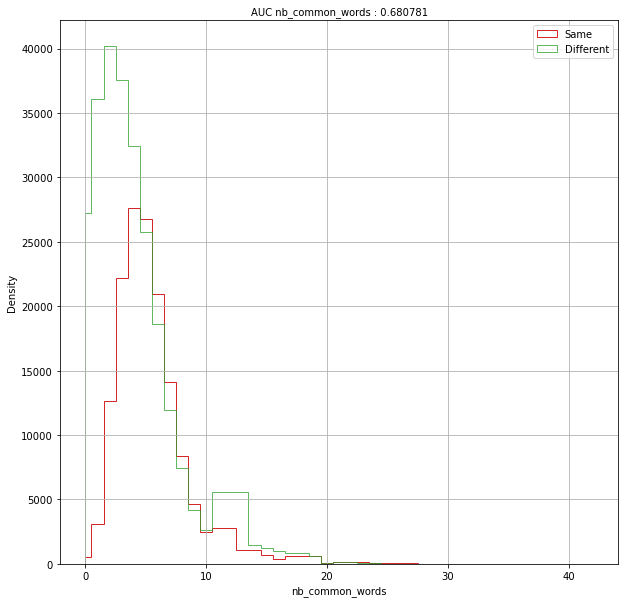

<Figure size 432x288 with 0 Axes>

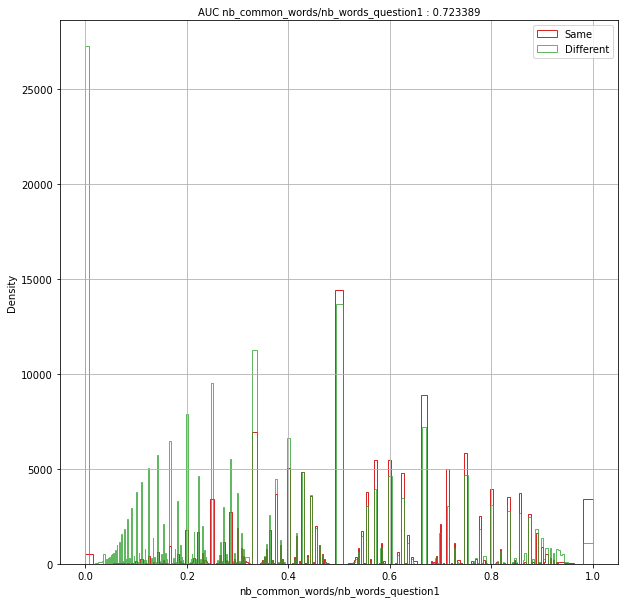

<Figure size 432x288 with 0 Axes>

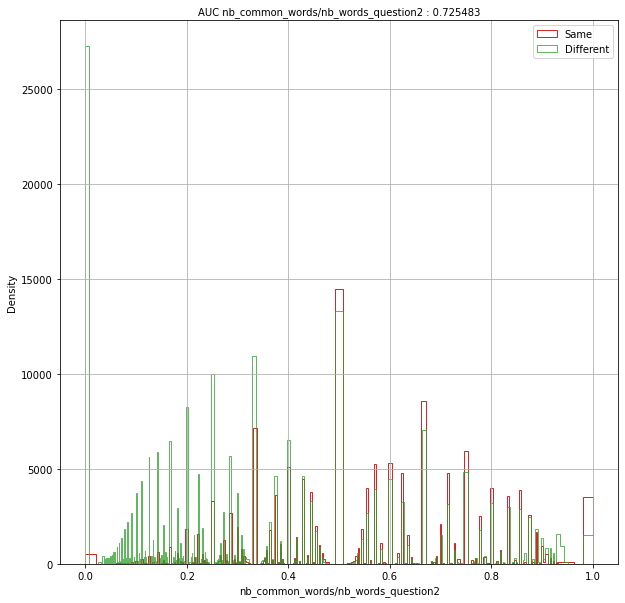

<Figure size 432x288 with 0 Axes>

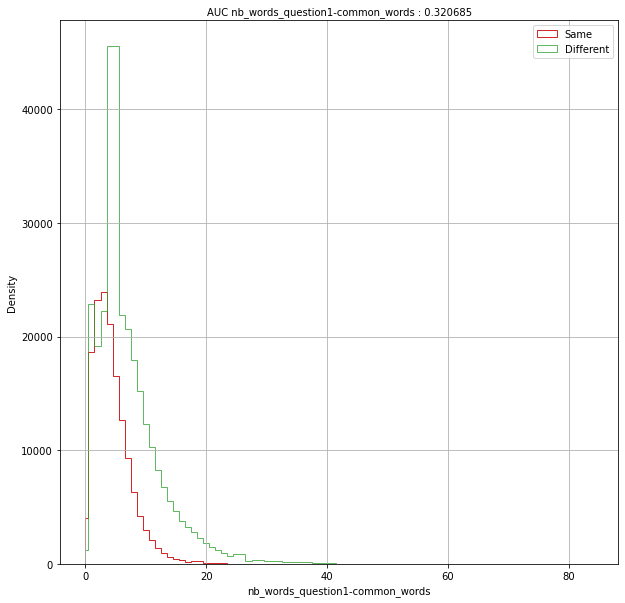

<Figure size 432x288 with 0 Axes>

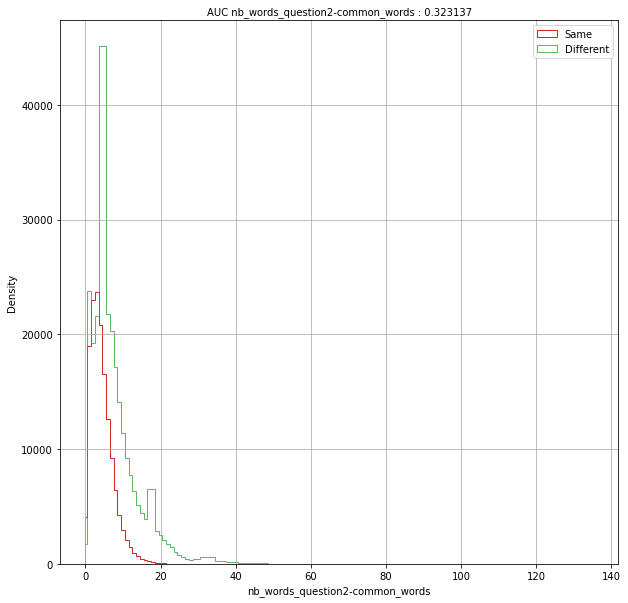

<Figure size 432x288 with 0 Axes>

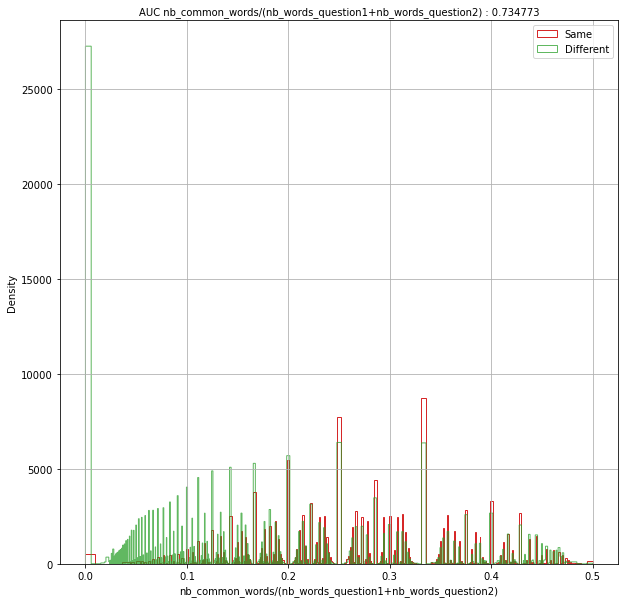

<Figure size 432x288 with 0 Axes>

In [8]:
from astropy.visualization import hist as as_hist

def display_simple_AUC_advanced_binning(dataframe,column_name):
    plot.figure(figsize=(10,10))
    palette = sns.color_palette()
    as_hist(dataframe[column_name][dataframe['is_duplicate']==1],bins="blocks",color=palette[3],label='Same',histtype='step')
    as_hist(dataframe[column_name][dataframe['is_duplicate']==0],bins="blocks",color=palette[2],label='Different',alpha = 0.75,histtype='step')
    plot.title('AUC %s : %f' % (column_name,simple_weighted_AUC(dataframe,column_name)) , fontsize=10)
    plot.xlabel(column_name)
    plot.ylabel('Density')
    plot.grid(True)
    plot.legend()
    plot.show()
    plot_save('distrib_advanced_binning_'+column_name.replace('/','_div_').replace(' ','_'))

    
def show_all_simple_AUC_advanced_binning(dataframe):
    all =  all_numeric_columns(dataframe)
    print_section( 'Show AUC on %s unique features' % str(all))
    for name in all:
        show_AUC(dataframe,name)
    print()
    # show that smart graphs about column_name
    for name in all:
        show_AUC(dataframe,name)
        display_simple_AUC_advanced_binning(dataframe,name)
    print_done('Done')

show_all_simple_AUC_advanced_binning(train_dataframe)

Some other facts about the variables we've just added

is_duplicate                                               1.000000
nb_common_words/(nb_words_question1+nb_words_question2)    0.370994
nb_common_words/nb_words_question2                         0.359681
nb_common_words/nb_words_question1                         0.358852
nb_words_question1-common_words                            0.301578
nb_words_question2-common_words                            0.295709
nb_common_words                                            0.225751
nb_words_question2                                         0.160401
nb_words_question1                                         0.154250
Name: is_duplicate, dtype: float64


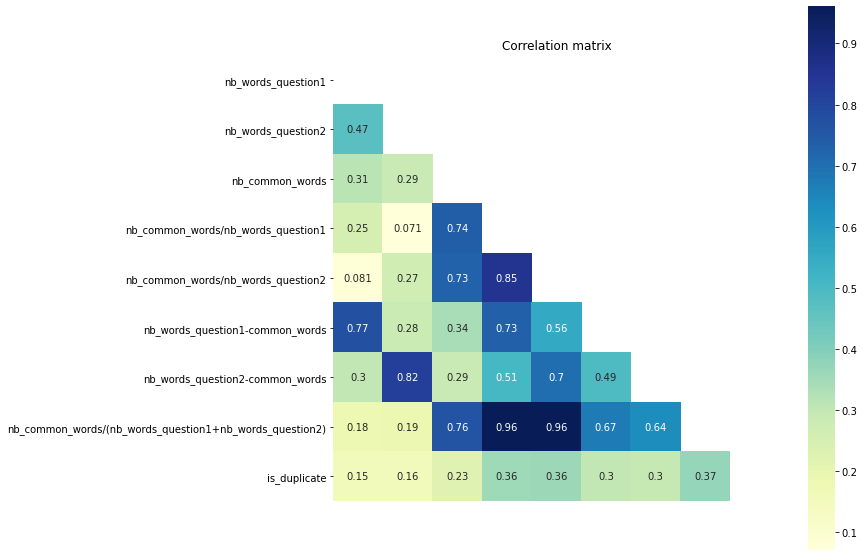

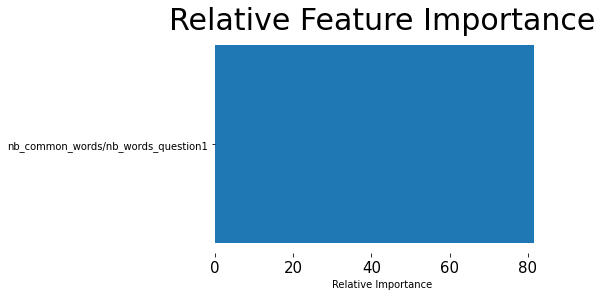

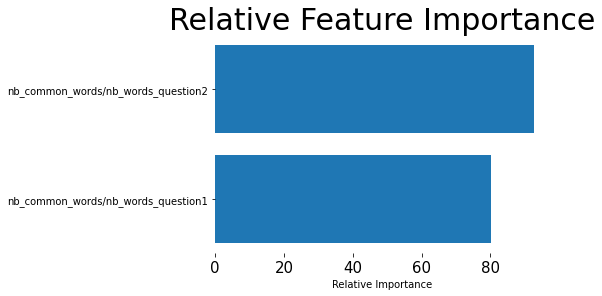

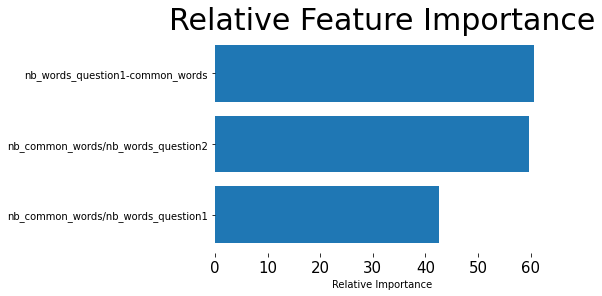

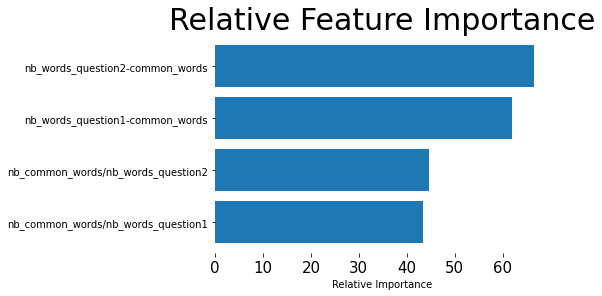

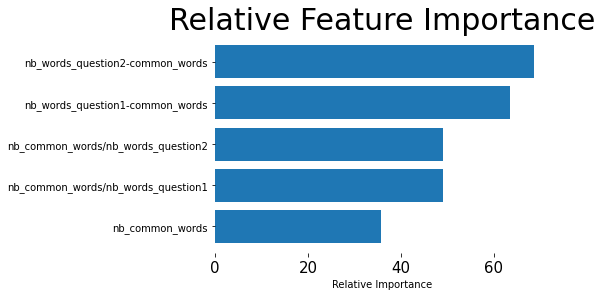

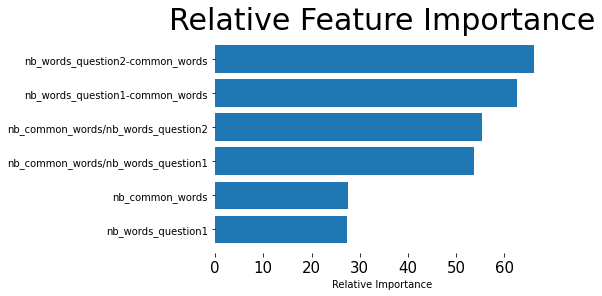

[3 4 7]
[0.32679829 0.29054409 0.38265762]


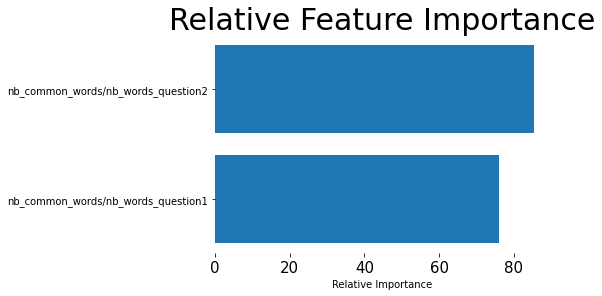

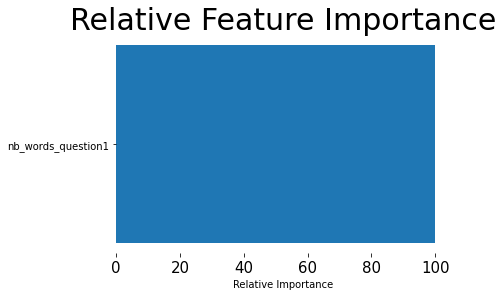

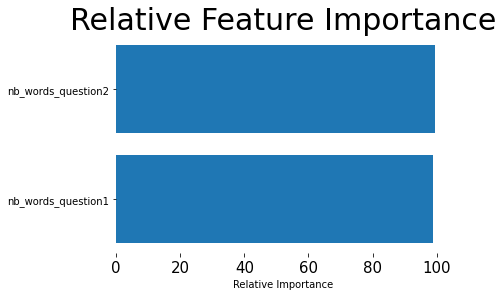

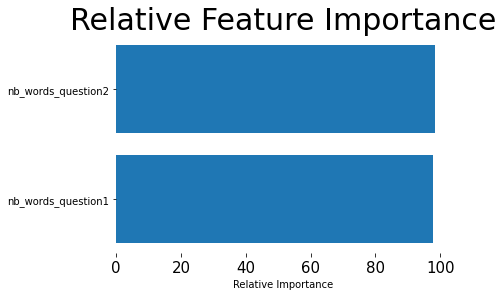

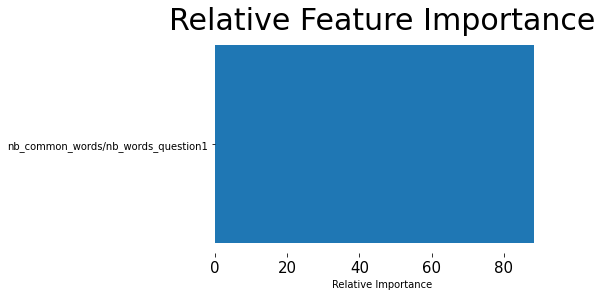

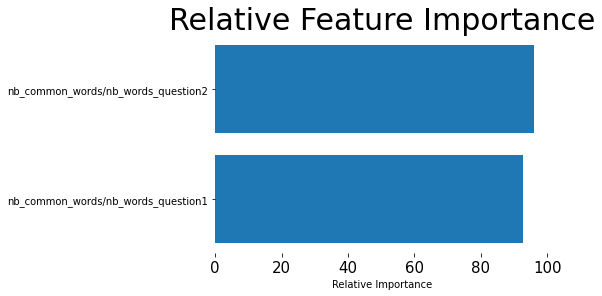

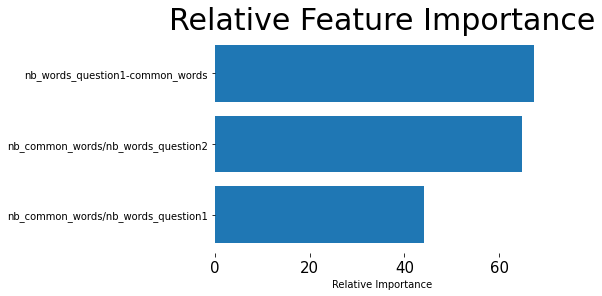

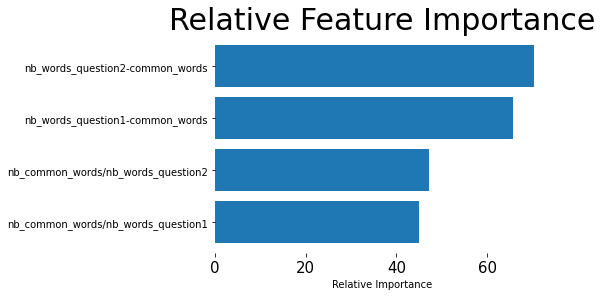

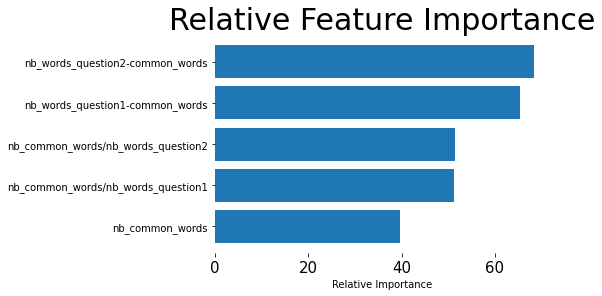

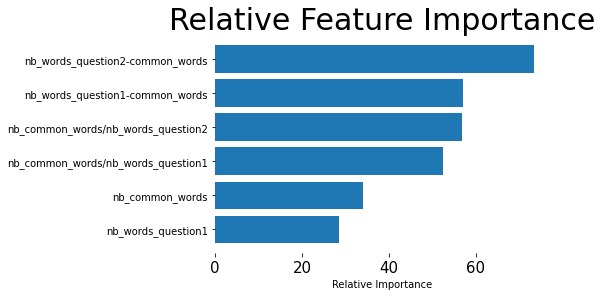

In [9]:
from sklearn import feature_selection
from sklearn.feature_selection import SelectKBest,f_classif,RFE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.decomposition import PCA

def graph_relative_feature_importance(features_importances,columns):
    # Make importances relative to max importance.
    features_importances = 100.0 * (features_importances / features_importances.max())
    sorted_idx = numpy.argsort(features_importances)
    sorted_idx = sorted_idx[-20:-1:1]
    pos = numpy.arange(sorted_idx.shape[0]) + 0.5
    plot.barh(pos, features_importances[sorted_idx], align='center')
    plot.yticks(pos, columns)
    plot.xlabel('Relative Importance')
    plot.title('Relative Feature Importance', fontsize=30)
    plot.tick_params(axis='x', which='major', labelsize=15)
    sns.despine(left=True, bottom=True)
    plot.show()

def graph_feature_importance(features_importances,columns):
    # Make importances relative to max importance.
    sorted_idx = numpy.argsort(features_importances)
    sorted_idx = sorted_idx[-20:]
    pos = numpy.arange(sorted_idx.shape[0]) + 0.5
    plot.barh(pos, features_importances[sorted_idx], align='center')
    plot.yticks(pos, columns)
    plot.xlabel('Importance')
    plot.title('Feature Importance', fontsize=30)
    plot.tick_params(axis='x', which='major', labelsize=15)
    #sns.despine(left=True, bottom=True)
    plot.show()

def independant_features_analysis(name_data,input_df,target_df):
    train_df = input_df[all_numeric_columns(input_df)]
    target_df = target_df
    small = int(len(target_df)*0.05)
    small_train = train_df.sample(small,random_state=42)
    small_target = target_df.sample(small,random_state=42)
    small_weights = input_df[WEIGHT].sample(small,random_state=42)

    # be careful all_numeric will include also the target soon
    all_numeric = all_numeric_columns(input_df)
    print_section('Minimal analysis of numeric features of %s' % name_data)
    print_info('Nb features: %d' % len(all_numeric))
    print_info(str(all_numeric))
    print_warning('Is there any null value ? %s' % input_df.isnull().any().any())

    compute_variances = feature_selection.VarianceThreshold()
    all_numeric.append('is_duplicate')
    variances = compute_variances.fit_transform(input_df[all_numeric])
    print_warning('Is there any low variance feature ? %s' % str(variances.shape[1]!=len(all_numeric)))
    print_info('Here are the correlations to the target "is_duplicate"')
    correlation_matrix = input_df[all_numeric].corr().abs()
    print(correlation_matrix['is_duplicate'].nlargest(len(all_numeric)))

    correlation_matrix_without_is_duplicate = correlation_matrix['is_duplicate'][correlation_matrix['is_duplicate']<1]
    highest_correlated_feature = correlation_matrix_without_is_duplicate.nlargest(1).index[0]
    highest_correlation = correlation_matrix_without_is_duplicate.nlargest(1)[0]
    if highest_correlation >0.2:
        if highest_correlation < 0.5:
            print_warning('%s is the most correlated with target but %f is quite weak' % (highest_correlated_feature,highest_correlation))
        else:
            print_info('%s is the most correlated with target but %f is very weak' % (highest_correlated_feature,highest_correlation))
    else:
        print_alert('%s is the most correlated with target and %f is quite big' % (highest_correlated_feature,highest_correlation))
    plot.figure(figsize=(10, 10))
    sns.heatmap(correlation_matrix,annot=True,cbar=True,square=True,cmap='YlGnBu',mask = numpy.triu(correlation_matrix),xticklabels=False)
    plot.title('Correlation matrix')
    plot_save('correlation_matrix')
    plot.show()

    # we keep only numeric features and remove is_duplicate
    all_numeric = all_numeric_columns(input_df)

    print_section('Here are the features that would be selected with a simple univariate analysis')
    start = time.time()
    for r in tqdm(range(1,len(all_numeric))):
        k_best = SelectKBest(score_func=f_classif,k=r)
        fit = k_best.fit(small_train,small_target)
        best_columns = [small_train.columns[c] for c in fit.get_support(indices=True)]
        print_info('Nb features to keep %d:%s' %(r,best_columns))
        
        # Can we graph relative importances
        if r>1:
            # transform train set so we can compute importances
            univariate_features = fit.transform(small_train)
            rfc = RandomForestClassifier(n_estimators=100)
            rfc_scores = cross_val_score(rfc, univariate_features, small_target, cv=5, scoring='neg_log_loss',n_jobs=os.cpu_count())
            features_importance = rfc.fit(univariate_features, small_target).feature_importances_
            graph_relative_feature_importance(features_importance,best_columns)
    print_done('Done',top=start)
    
    print_section('Here are the features that would be selected a priori from default Multinomial Naive Bayes')
    start = time.time()   
    mnb = MultinomialNB()
    best_from_model = feature_selection.SelectFromModel(mnb)
    fit = best_from_model.fit(small_train,small_target,sample_weight=small_weights)
    print(fit.get_support(indices=True))
    best_columns = [small_train.columns[c] for c in fit.get_support(indices=True)]
    # transform train set so we can compute importances
    mnb_features = fit.transform(small_train)
    rfc = RandomForestClassifier(n_estimators=100)
    rfc_scores = cross_val_score(rfc, mnb_features, small_target, cv=5, scoring='neg_log_loss',n_jobs=os.cpu_count())
    features_importance = rfc.fit(mnb_features, small_target).feature_importances_
    print(features_importance)
    print_info('features to keep :%s logloss %.4f %.4f' %(best_columns,-rfc_scores.mean(),rfc_scores.std()))
    graph_relative_feature_importance(features_importance,best_columns)
    print_done('Done',top=start)
    

    print_info('Try to keep x \% of variance with a PCA')
    print_alert('bug ?')
    start = time.time()
    for r in tqdm([.8,.9,.95]):
        acp = PCA(r)
        principal_components = acp.fit_transform(small_train)
        principal_df = pandas.DataFrame(principal_components).sample(small,random_state=42)
        rfc = RandomForestClassifier(n_estimators=100)
        rfc_scores = cross_val_score(rfc, principal_df, small_target, cv=5, scoring='neg_log_loss',n_jobs=os.cpu_count())
        features_importance = rfc.fit(principal_df, small_target).feature_importances_
        print_info('%% of variance %f:%s' %(r,'aie'))
        graph_relative_feature_importance(features_importance,small_train.columns)
    print_done('Done',top=start)

    print_section('Here are the features that would be selected with a recursive feature elimination')
    start = time.time()
    print_alert('Doomed to fail : RFE does not support to transmit ,sample_weight=small_weights')
    print_alert('ix is waiting since 2016 ?')
    for r in tqdm(range(1,len(all_numeric))):
        mnb = MultinomialNB()
        recursive_best= feature_selection.RFE(mnb, n_features_to_select=r)
        fit = recursive_best.fit(small_train,small_target)
        best_columns = [small_train.columns[c] for c in fit.get_support(indices=True)]
        print_info('Nb features to keep %d:%s' %(r,best_columns))
        
        # Can we graph relative importances
        if r>1:
            # transform train set so we can compute importances
            recursive_features = fit.transform(small_train)
            rfc = RandomForestClassifier(n_estimators=100)
            rfc_scores = cross_val_score(rfc, recursive_features, small_target, cv=5, scoring='neg_log_loss',n_jobs=os.cpu_count())
            features_importance = rfc.fit(recursive_features, small_target).feature_importances_
            graph_relative_feature_importance(features_importance,best_columns)
    print_done('Done',top=start)
   

# !!!!! a little bit long
independant_features_analysis('train',train_dataframe,train_dataframe['is_duplicate'])

Basic XGBoost code with all default parameters

In [10]:
# Simple XGBoost code
# 

import xgboost 

params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'eta' : 0.02,
    'max_depth':3 
    }



def print_res_xgboost(infos):
    # Glurk
    print_info(' | '.join([('%s '+f) % (k,infos[k]) for k,f in INFO_XGBOOST_MODEL.items() if k in infos]))

# 80% training 20% validation
def build_XGBoost_model_80_20(training,target,column_names,show=True):
    input_train,input_test,target_train,target_test = train_test_split(training,target,random_state=42,test_size=0.2)
    final_input_train = input_train[list(column_names)]
    final_input_test = input_test[list(column_names)]
    train_dm = xgboost.DMatrix(final_input_train, label = target_train, weight = input_train[WEIGHT],nthread = -1)
    validation_dm = xgboost.DMatrix(final_input_test, label = target_test,weight = input_test[WEIGHT])
    watchlist = [(train_dm, 'train'), (validation_dm, 'valid')]

    start = time.time()
    if show:
        verbose = 10
    else:
        verbose = 0
    model = xgboost.train(params,train_dm,400,watchlist,early_stopping_rounds=50,verbose_eval=verbose)
    infos = compute_metrics_model_xgboost(model,final_input_test,target_test,sample_weight = input_test[WEIGHT],show=show)
    duration = time.time()-start
    infos.update({'time':duration})
    if show:      
        print_res_xgboost(infos)
    return  infos

# Pushing the limits :100 % training no validation !!
# Just in case it allows to gain small digits in kaggle score...
# Actually not used ...
def build_XGBoost_model_100_0(training,target,column_names,show=True):
    final_train = training[list(column_names)]
    final_target = target
    final_weight = training[WEIGHT]

    train_dm = xgboost.DMatrix(final_train, label = final_target, weight = final_weight,nthread = -1)
    watchlist = [(train_dm, 'train')]

    start = time.time()
    if show:
        verbose = 10
    else:
        verbose = 0
    model = xgboost.train(params,train_dm,400,watchlist,early_stopping_rounds=50,verbose_eval=verbose)
    duration = time.time()-start
    infos = compute_metrics_model_xgboost(model,final_train,final_target,sample_weight = final_weight,show=show)
    infos.update({'time':duration})
    if show:      
        print_res_xgboost(infos)
    return  infos

def compute_metrics_model_xgboost(model,input_df,target_df,sample_weight = None,show = True):
    final_input = xgboost.DMatrix(input_df)
    prediction_proba_df = model.predict(final_input,ntree_limit=model.best_ntree_limit)
    # Hum shouldn't we challenge this 50% threshold ?
    prediction_df = numpy.where(prediction_proba_df>0.5,1,0)
    res = metrics.classification_report(target_df,prediction_df,sample_weight = sample_weight,output_dict=True)
    accuracy = res['accuracy']
    score = res['weighted avg']['f1-score']
    logloss_proba = metrics.log_loss(target_df,prediction_proba_df,sample_weight = sample_weight)
    if show:
        print_info('Classification report')
        print(metrics.classification_report(target_df,prediction_df,sample_weight = sample_weight))
    return {
             'accuracy':accuracy,
             'score':score,
             'logloss_proba':logloss_proba,
             'model':model
           }

INFO_XGBOOST_MODEL= {
    'logloss_proba': '%.4f',
    'score': '%.4f',
    'accuracy': '%.4f',
    'time': '%.2f'
}

print_res_xgboost({'alain':1})

if UNITARY_TEST:
    print_section('Unitary test : playbox XGBoost 80_20')
    small_train = train_dataframe.sample(1000,random_state=42)
    print_section('Unitary test : playbox XGBoost 100_0')
    res = build_XGBoost_model_100_0(small_train,small_train['is_duplicate'],all_numeric_columns(small_train))
    print(res)

if UNITARY_TEST:
    print_section('Unitary test : playbox XGBoost 80_20')
    small_train = train_dataframe.sample(1000,random_state=42)
    print_section('Unitary test : playbox XGBoost 80_20')
    res = build_XGBoost_model_80_20(small_train,small_train['is_duplicate'],all_numeric_columns(small_train))
    print(res)

[0]	train-logloss:0.68312
Will train until train-logloss hasn't improved in 50 rounds.
[10]	train-logloss:0.60117
[20]	train-logloss:0.54292
[30]	train-logloss:0.50033
[40]	train-logloss:0.46881
[50]	train-logloss:0.44454
[60]	train-logloss:0.42584
[70]	train-logloss:0.41138
[80]	train-logloss:0.40017
[90]	train-logloss:0.39126
[100]	train-logloss:0.38414
[110]	train-logloss:0.37851
[120]	train-logloss:0.37392
[130]	train-logloss:0.37008
[140]	train-logloss:0.36683
[150]	train-logloss:0.36411
[160]	train-logloss:0.36159
[170]	train-logloss:0.35966
[180]	train-logloss:0.35764
[190]	train-logloss:0.35586
[200]	train-logloss:0.35424
[210]	train-logloss:0.35271
[220]	train-logloss:0.35109
[230]	train-logloss:0.34996
[240]	train-logloss:0.34870
[250]	train-logloss:0.34750
[260]	train-logloss:0.34638
[270]	train-logloss:0.34532
[280]	train-logloss:0.34437
[290]	train-logloss:0.34315
[300]	train-logloss:0.34231
[310]	train-logloss:0.34114
[320]	train-logloss:0.34031
[330]	train-logloss:0.3394

              precision    recall  f1-score   support

           0       0.84      1.00      0.91 833.5098453967706
           1       0.91      0.07      0.14 171.66892895091271

    accuracy                           0.84 1005.1787743476833
   macro avg       0.87      0.54      0.52 1005.1787743476833
weighted avg       0.85      0.84      0.78 1005.1787743476833



{'accuracy': 0.8406167515451067, 'score': 0.7798873649808924, 'logloss_proba': 0.3336249977753858, 'model': <xgboost.core.Booster object at 0x7f9cf504c0d0>, 'time': 0.6726243495941162}


[0]	train-logloss:0.68328	valid-logloss:0.68314
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 50 rounds.
[10]	train-logloss:0.60240	valid-logloss:0.60009
[20]	train-logloss:0.54471	valid-logloss:0.54099
[30]	train-logloss:0.50233	valid-logloss:0.49781
[40]	train-logloss:0.47048	valid-logloss:0.46532
[50]	train-logloss:0.44663	valid-logloss:0.44162
[60]	train-logloss:0.42830	valid-logloss:0.42335
[70]	train-logloss:0.41411	valid-logloss:0.40895
[80]	train-logloss:0.40302	valid-logloss:0.39777
[90]	train-logloss:0.39388	valid-logloss:0.38859
[100]	train-logloss:0.38654	valid-logloss:0.38232
[110]	train-logloss:0.38098	valid-logloss:0.37647
[120]	train-logloss:0.37655	valid-logloss:0.37169
[130]	train-logloss:0.37282	valid-logloss:0.36799
[140]	train-logloss:0.36961	valid-logloss:0.36490
[150]	train-logloss:0.36675	valid-logloss:0.36239
[160]	train-logloss:0.36418	valid-logloss:0.36064
[170]	trai

              precision    recall  f1-score   support

           0       0.84      0.99      0.91 168.7955573880411
           1       0.59      0.06      0.10 33.5771183347514

    accuracy                           0.84 202.37267572279248
   macro avg       0.72      0.52      0.51 202.37267572279248
weighted avg       0.80      0.84      0.78 202.37267572279248



{'accuracy': 0.8369644406229078, 'score': 0.7763626965171507, 'logloss_proba': 0.351159869815969, 'model': <xgboost.core.Booster object at 0x7f9d1a442580>, 'time': 0.4249255657196045}


Another bunch of code. Just wrappers so we do in one shot:
* generate a set of models given a set of columns
* keep their results in memory
* save all models to excel
* dump everything (including the models) in a cache so all previous steps can be done in a sec
* find the best model (related to logloss)
* generate a file of predictions suitable for kaggle
* prepare everything for a kaggle submission
* show the statement to do the submission to kaggle


Current exploration methods available, given n columns
* generate models using from 1 to n columns (8 columns will generate 8 models)
* generate models using **ALL** combinations of n columns (->8 columns generates 256 models)
* only one model

In [11]:
def find_best_result(results,metric):
    if 'logloss' in metric:
        return results.nsmallest(1,metric)
    else:
        return results.nlargest(1,metric)
        
def apply_xgboost(model,columns,input_df):
    res = pandas.DataFrame()
    res['test_id'] = input_df['test_id']
    res['is_duplicate'] = model.predict(xgboost.DMatrix(input_df[columns]))
    return res

def submit_best_result(results,input_df,file_name,kaggle_message,metric='logloss_proba'):
    start = time.time()
    print_section("Scoring XGBoost model with best %s: %s" % (metric,kaggle_message))
    csv_file_name = absolute_env_file_name(file_name,ext='.csv')
    print_info('Generating scores in %s' % csv_file_name)
    best = find_best_result(results,metric)
    model = best['model'][0]
    columns = best['columns'][0]
    prediction = apply_xgboost(model,columns,input_df)
    prediction.to_csv(csv_file_name,index=False)
    print_info('Zipping file')
    absolute_file_name_zip = zip_file_and_delete(csv_file_name)
    print_done('Done',top=start)
    print_info('%s is ready' % absolute_file_name_zip)
    print_warning('Use this commands to submit apply results to kaggle')
    print_warning('kaggle competitions submit quora-question-pairs -f "%s" -m "%s %s"' % (absolute_file_name_zip,EXPERIMENT,kaggle_message))
    return prediction

def n_columns(columns,n):
    return columns[0:n]

def xgboost_80_20_one_more_field_at_a_time(dataframe,columns_to_explore,explore=True,show=False):
    if explore:
        print_section("XGBoost (80,20) on 1 to %d fields" % len(columns_to_explore))
    else:
        print_section("XGBoost (80,20) on %d fields" % len(columns_to_explore))
    start = time.time()
    res_final = dict()
    min_log_loss = 1000
    best = 0
    best_cols =''
    # a shortcut is possible
    if explore:
        first_nb = 1
    else:
        first_nb=len(columns_to_explore)
    for i in tqdm(range(first_nb,len(columns_to_explore)+1)):
        columns = n_columns(columns_to_explore,i)
        res = build_XGBoost_model_80_20(dataframe,dataframe['is_duplicate'],columns,show = show)
        cur_logloss = res['logloss_proba']
        if cur_logloss<min_log_loss:
            print_info("%d:%.4f %s" % (i,cur_logloss,columns))
            min_log_loss = cur_logloss
            best_cols = columns
            best = i
        else:
            print_warning("%d:%.4f" % (i,cur_logloss))
        res.update( {'columns':columns})
        res_final.update({str(i):res})
    print_info('Best: %d %.4f %s' % (best,min_log_loss,best_cols))
    print_done('Done',top=start)
    return pandas.DataFrame.from_dict(res_final, orient='index')

# try to reload from cache an exploration
# if not available, redo it and save results in cache
# find the best result according to a metric (default logloss_proba)
# and submit it to kaggle
def study_models_one_more_field_at_a_time(message,tag,columns,train_df,challenge_df,explore=True,show=False):
    print_section(message)
    results = load_or_build_dataframe('Rebuild XGBoost models',tag + '_results',lambda df:xgboost_80_20_one_more_field_at_a_time(df,columns,explore=explore,show=show),train_df)
    save_models_dict_to_excel(results,tag=tag)
    display(results.describe())
    submit_best_result(results,challenge_df,'Best_'+tag,'Best ' + tag)
    return results

Let's build a xgboost model on all features (no exploration of any kind) and see what we get

**IMPORTANT**: confusion matrix and so are computed using default threshold of 0.5

So, first of all: the features are all numeric clumns (except obviusly, id, target and weight)

In [91]:
ALL_FEATURES = all_numeric_columns(train_dataframe)
print_info('Features are: %s' % str(ALL_FEATURES))

In [13]:

xgboost_everything_results = xgboost_80_20_one_more_field_at_a_time(
    train_dataframe,
    ALL_FEATURES,
    explore = False,
    show = True)

[0]	train-logloss:0.68340	valid-logloss:0.68346
Multiple eval metrics have been passed: 'valid-logloss' will be used for early stopping.

Will train until valid-logloss hasn't improved in 50 rounds.
[10]	train-logloss:0.60410	valid-logloss:0.60462
[20]	train-logloss:0.54858	valid-logloss:0.54957
[30]	train-logloss:0.50857	valid-logloss:0.50976
[40]	train-logloss:0.47912	valid-logloss:0.48063
[50]	train-logloss:0.45719	valid-logloss:0.45894
[60]	train-logloss:0.44067	valid-logloss:0.44264
[70]	train-logloss:0.42819	valid-logloss:0.43026
[80]	train-logloss:0.41860	valid-logloss:0.42082
[90]	train-logloss:0.41114	valid-logloss:0.41357
[100]	train-logloss:0.40541	valid-logloss:0.40796
[110]	train-logloss:0.40097	valid-logloss:0.40358
[120]	train-logloss:0.39745	valid-logloss:0.40018
[130]	train-logloss:0.39471	valid-logloss:0.39749
[140]	train-logloss:0.39253	valid-logloss:0.39538
[150]	train-logloss:0.39076	valid-logloss:0.39371
[160]	train-logloss:0.38940	valid-logloss:0.39232
[170]	trai

              precision    recall  f1-score   support

           0       0.83      1.00      0.90 66475.35427891841
           1       0.57      0.02      0.03 14213.525233116525

    accuracy                           0.82 80688.87951203494
   macro avg       0.70      0.51      0.47 80688.87951203494
weighted avg       0.78      0.82      0.75 80688.87951203494



Rush on Kaggle to make a submission and get our evaluation

In [96]:
submit_best_result(xgboost_everything_results,challenge_dataframe,'xgboost_basic_features','xgboos basic features no prep/post processing',metric='logloss_proba')
submissions=load_kaggle_submissions()
get_last_submissions(submissions)

,date,publicScore,privateScore,description,fileName
0,2020-10-25 15:26:26,0.39206,0.39597,xgboost_basic_features xgboos basic features no prep/post processing,xgboost_basic_features.zip
1,2020-10-09 07:49:33,0.32483,0.32736,playbox all features + hyperopt 200x200000,hyper_opt_on_all_features.zip
2,2020-10-08 22:01:24,0.38188,0.38887,playbox all with hyper 2,todel.zip


OK, logloss is what it is,
What is actually predicting our model ?

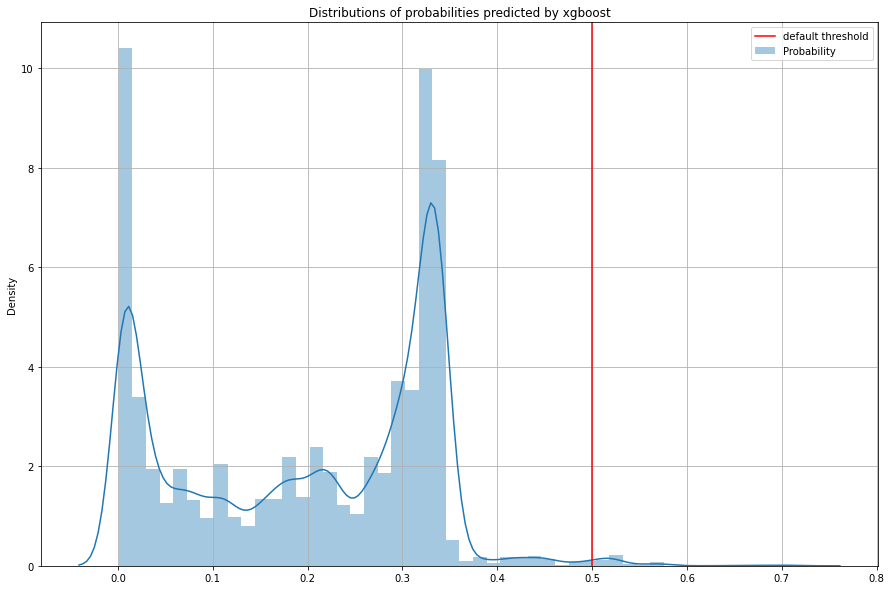

In [106]:
model = xgboost_everything_results['model'][0]
# do the usual split (80,20)
input_train,input_test,target_train,target_test = train_test_split(train_dataframe,train_dataframe['is_duplicate'],random_state=42,test_size=0.2)
test_probabilities = model.predict(xgboost.DMatrix(input_test[ALL_FEATURES]),ntree_limit=model.best_ntree_limit)
train_probabilities = model.predict(xgboost.DMatrix(input_train[ALL_FEATURES]),ntree_limit=model.best_ntree_limit)
challenge_probabilities = model.predict(xgboost.DMatrix(challenge_dataframe[ALL_FEATURES]),ntree_limit=model.best_ntree_limit)

# Apply the standard threshold
test_predictions = numpy.where(test_probabilities>0.5,1,0)
train_predictions = numpy.where(train_probabilities>0.5,1,0)
challenge_predictions = numpy.where(challenge_probabilities>0.5,1,0)

# What do we have in predictions
print_info('On test %% of true duplicates is %.3f' % (target_test.mean()*100.))
print_warning('On test %% of predicted duplicates is %.3f !!' % (test_predictions.mean()*100.))

print_info('On train %% of true duplicates is %.3f' % target_train.mean())
print_warning('On train %% of predicted duplicates is %.3f !!' % (train_predictions.mean()*100.))

print_warning('On challenge %% of predicted duplicates is %.3f !!' % (challenge_predictions.mean()*100.))

plot.figure(figsize=(15,10))
sns.distplot(test_probabilities,label='Probability', kde=True)
plot.axvline(x=0.5,color='r',label='default threshold')
plot.legend()
plot.grid(True)
plot.title("Distributions of probabilities predicted by xgboost")
plot_save('distribution_uncalibrated_probabilities_xgboost')


What about the confusion matrix ?

              precision    recall  f1-score   support

           0       0.83      1.00      0.90 66475.35427891841
           1       0.57      0.02      0.03 14213.525233116525

    accuracy                           0.82 80688.87951203494
   macro avg       0.70      0.51      0.47 80688.87951203494
weighted avg       0.78      0.82      0.75 80688.87951203494



AxesSubplot(0.125,0.125;0.775x0.755)


<Figure size 720x720 with 0 Axes>

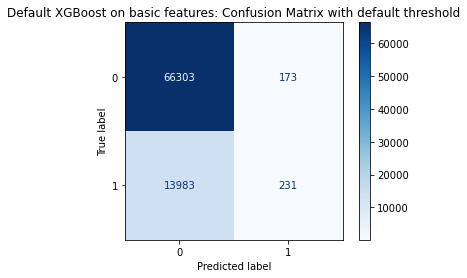

<Figure size 720x720 with 0 Axes>

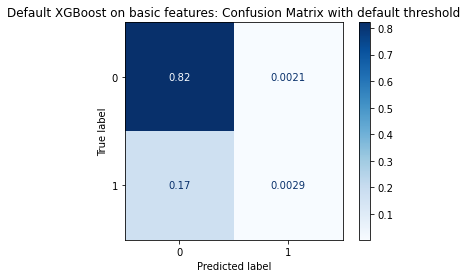

In [89]:
from sklearn.metrics import confusion_matrix
from sklearn.metrics import ConfusionMatrixDisplay

def show_confusion_matrix(model,columns,input,target):
    input_train,input_test,target_train,target_test = train_test_split(input,target,random_state=42,test_size=0.2)
    input_train_weight = input_train['weight']
    input_test_weight = input_test['weight']

    test_probabilities = model.predict(xgboost.DMatrix(input_test[columns]),ntree_limit=model.best_ntree_limit)

    test_predictions = numpy.where(test_probabilities>0.5,1,0)
    # Last minute check
    nb_0 = numpy.where(test_predictions==0,1,0).sum()
    nb_1 = numpy.where(test_predictions==1,1,0).sum()
    assert (nb_1+nb_0) == len(test_predictions)

    print_info('Performances')
    print(metrics.classification_report(target_test,test_predictions,sample_weight=input_test_weight))
    print_warning('%% prediction of is_duplicate=1 in test !!! : %.3f' % (test_predictions.mean()*100.))
    logloss_proba = metrics.log_loss(target_test,test_probabilities,sample_weight=input_test_weight,normalize=True)
    print_warning('logloss in test %.3f' % logloss_proba)

    # display cool graphs
    plot.figure(figsize=(10, 10))
    fig,ax = plot.subplots()
    print(ax)
    uncalibrated_confusion_matrix = confusion_matrix(target_test,test_predictions,sample_weight=input_test_weight)
    ConfusionMatrixDisplay(uncalibrated_confusion_matrix).plot(cmap=plot.cm.Blues,values_format=".0f",ax=ax)
    uncalibrated_confusion_matrix = confusion_matrix(target_test,test_predictions,sample_weight=input_test_weight,normalize="all")
    plot.title('Default XGBoost on basic features: Confusion Matrix with default threshold')
    plot_save('xgboost_basic_features_confusion_matrix1')

    plot.figure(figsize=(10, 10))
    fig,ax = plot.subplots()
    ConfusionMatrixDisplay(uncalibrated_confusion_matrix).plot(cmap=plot.cm.Blues,ax=ax)
    plot.title('Default XGBoost on basic features: Confusion Matrix with default threshold')
    plot_save('xgboost_basic_features_confusion_matrix2')
    


show_confusion_matrix(model,ALL_FEATURES,train_dataframe,train_dataframe['is_duplicate'])

Interesting :

* we can have a 'not so bad' logloss and very bad predictions. Good Kaggle score does not mean good model
* XGBoost lib has an issue : it is using a non parametric sigmoid when emitting proabilities (checked by our team at SAP)


So, globally, looks like we have a calibration issue...


Let's check it with a smart graph : Reliability Curve

Reliability curve displays the number of predicted probabilities (y) that are under a given probability (x). So if the curve is above the diagonal (perfect), it means probabilities are **underestimated**.


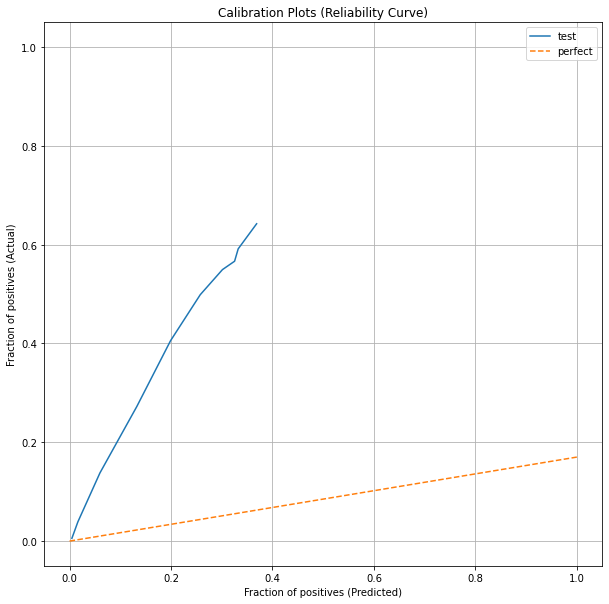

In [31]:
from sklearn.calibration import calibration_curve

plot.figure(figsize=(10,10))
plot_test_truth, plot_test_predictions = calibration_curve(target_test, test_probabilities,strategy='quantile', n_bins=10)
plot.plot(plot_test_predictions, plot_test_truth,label='test')
# Useless to draw train curve : almost identical to test and therefore, invisible
# plot_train_truth, plot_train_predictions = calibration_curve(target_train, train_probabilities,strategy='quantile', n_bins=10)
# plot.plot(plot_train_predictions, plot_train_truth,label='train')

xmin = min(plot_test_predictions.min(), plot_test_truth.min())
xmax = max(plot_test_predictions.max(), plot_test_truth.max())
#plot.plot([xmin,xmax],[xmin,xmax], '--',label='perfect')
plot.plot([0, 1], [0, 0.17], '--', label='perfect')
plot.xlabel('Fraction of positives (Predicted)')
plot.ylabel('Fraction of positives (Actual)')
plot.ylim([-0.05, 1.05])
plot.legend() # loc='upper left', ncol=2)
plot.title('Calibration Plots (Reliability Curve)')
plot.grid(True)
plot_save('xgboost_calibration_issue')


That's it : blue line is largely above the truth, meaning probabilities are very underestimated: model is under-casting

All metrics from confusion matrix are false...

We have to recalibrate!! 
* Platt scaling : builds a logistic regression model where only input is uncalibrated probabilities and output true target
* Isotonic regression : make a piecewise calibration

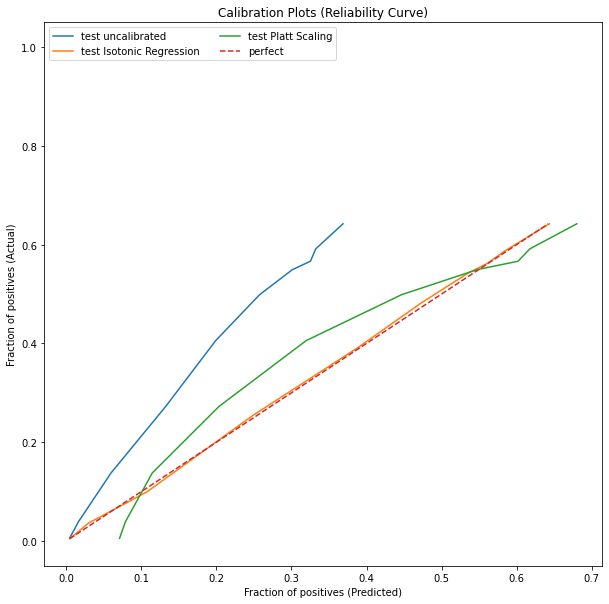

In [45]:
from sklearn.linear_model import LogisticRegression
from sklearn.base import BaseEstimator
from sklearn.calibration import IsotonicRegression


class MyPlattScaling(BaseEstimator):
    def __init__(self, log_odds: bool=True):
        self.log_odds = log_odds
    
    def fit(self, y_prob: numpy.ndarray, y_true: numpy.ndarray):
        self.fit_predict(y_prob, y_true)
        return self

    @staticmethod
    def _convert_to_log_odds(y_prob: numpy.ndarray):
        eps = 1e-12
        y_prob = numpy.clip(y_prob, eps, 1 - eps)
        y_prob = numpy.log(y_prob / (1 - y_prob))
        return y_prob

    def predict(self, y_prob: numpy.ndarray):
        if self.log_odds:
            y_prob = self._convert_to_log_odds(y_prob)

        output = self._transform(y_prob)
        return output

    def _transform(self, y_prob: numpy.ndarray):
        output = y_prob * self.coef_[0] + self.intercept_
        output = 1 / (1 + numpy.exp(-output))
        return output

    def fit_predict(self, y_prob: numpy.ndarray, y_true: numpy.ndarray) -> numpy.ndarray:
        if self.log_odds:
            y_prob = self._convert_to_log_odds(y_prob)

        # the class expects 2d ndarray as input features
        logistic = LogisticRegression(C=1e10, solver='lbfgs')
        logistic.fit(y_prob.reshape(-1, 1), y_true)
        self.coef_ = logistic.coef_[0]
        self.intercept_ = logistic.intercept_

        y_calibrated_prob = self._transform(y_prob)
        return y_calibrated_prob


isotonic = IsotonicRegression(out_of_bounds='clip',
                              y_min=train_probabilities.min(),
                              y_max=train_probabilities.max())
# still valid: learn on train, predict on test
isotonic.fit(train_probabilities,target_train)
isotonic_test_probabilities = isotonic.predict(test_probabilities)
isotonic_challenge_probabilities = isotonic.predict(challenge_probabilities)

platt = MyPlattScaling(log_odds=False)
# still valid: learn on train, predict on test
platt.fit(train_probabilities,target_train)
platt_test_probabilities = platt.predict(test_probabilities)
#platt_train_probabilities = platt.predict(train_probabilities)
platt_challenge_probabilities = platt.predict(challenge_probabilities)

# fig,ax = plot.subplots()
plot.figure(figsize=(10, 10))
plot_test_truth, plot_test_predictions = calibration_curve(target_test, test_probabilities,strategy='quantile', n_bins=10)
plot.plot(plot_test_predictions, plot_test_truth,label='test uncalibrated')

plot_test_truth, plot_test_predictions = calibration_curve(target_test, isotonic_test_probabilities,strategy='quantile', n_bins=10)
plot.plot(plot_test_predictions, plot_test_truth,label='test Isotonic Regression')

plot_test_truth, plot_test_predictions = calibration_curve(target_test, platt_test_probabilities,strategy='quantile', n_bins=10)
plot.plot(plot_test_predictions, plot_test_truth,label='test Platt Scaling')
plot.plot([xmin,xmax],[xmin,xmax], '--',label='perfect')
plot.xlabel('Fraction of positives (Predicted)')
plot.ylabel('Fraction of positives (Actual)')
plot.ylim([-0.05, 1.05])
plot.legend(loc='upper left', ncol=2)
plot.title('Calibration Plots (Reliability Curve)')
plot.show()

isotonic_test_predictions = numpy.where(isotonic_test_probabilities>0.5,1,0)
isotonic_challenge_predictions = numpy.where(isotonic_challenge_probabilities>0.5,1,0)
print_warning('Now, on test we have %.3f %% of 1 using Isotonic"s recalibrated probabilities' % isotonic_test_predictions.mean())
print_warning('And, on challenge we have %.3f %% of 1 using Isotonic"s recalibrated probabilities' % isotonic_challenge_predictions.mean())

platt_test_predictions = numpy.where(platt_test_probabilities>0.5,1,0)
platt_challenge_predictions = numpy.where(platt_challenge_probabilities>0.5,1,0)
print_info('Now, we have %.3f %% of 1 using Platt scaling"s recalibrated probabilities' % platt_test_predictions.mean())
print_info('And, on challenge we have %.3f %% of 1 using Platt scaling"s recalibrated probabilities' % platt_challenge_predictions.mean())


Better ...

I choose Platt Scaling for its simplicity and also because Isotonic despite looking strangely perfect has actually worst reult than Platt ...

What about confusion matrix now

Text(0.5, 1.0, 'Distributions  of probabilities')

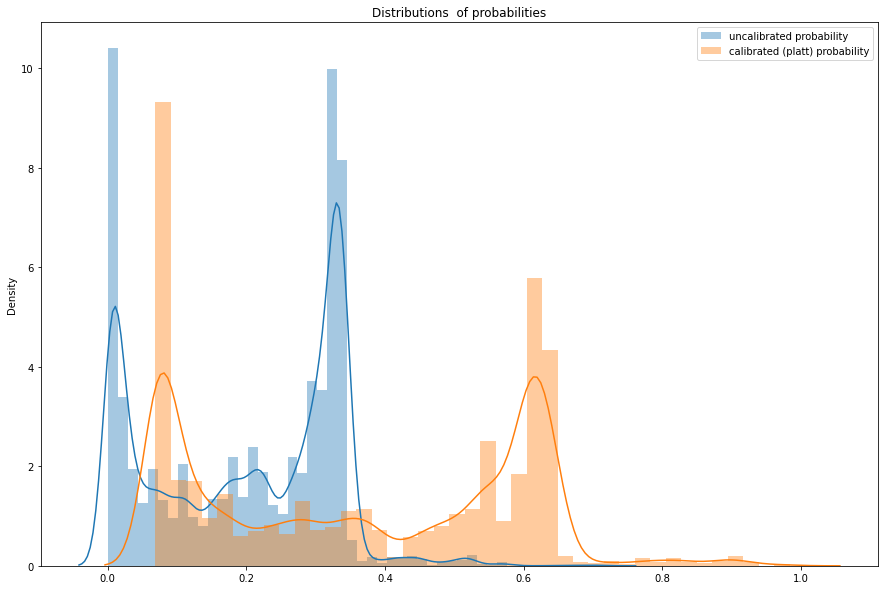

In [90]:
 plot.figure(figsize=(15,10))
 sns.distplot(test_probabilities,label='uncalibrated probability', kde=True)
 sns.distplot(platt_test_probabilities,label='calibrated (platt) probability', kde=True)
 #sns.distplot(isotonic_test_probabilities,label='calibrated (platt) probability', kde=True)
 plot.legend()
 plot.title("Distributions  of probabilities")
     
   

In [47]:
# test_predictions : predictions using uncalibrated probabilities
# test_probabilities : uncalibrated probabilities 
# platt_test_predictions : predictions using calibrated probabilities with Plott scaling
# platt_test_probabilities : calibrated probabilities
# target_test : the truth
print_info('Test has %d rows' %len(target_test))

print_warning('Uncalibrated')
print_warning("logloss % .3f" % metrics.log_loss(target_test,test_probabilities,sample_weight = input_test['weight']))
print(metrics.classification_report(target_test,test_predictions,sample_weight = input_test['weight']))

print_info('Calibrated')
print_info("logloss % .3f" % metrics.log_loss(target_test,platt_test_probabilities,sample_weight = input_test['weight']))
print(metrics.classification_report(target_test,platt_test_predictions,sample_weight = input_test['weight']))

              precision    recall  f1-score   support

           0       0.83      1.00      0.90 66475.35427891841
           1       0.57      0.02      0.03 14213.525233116525

    accuracy                           0.82 80688.87951203494
   macro avg       0.70      0.51      0.47 80688.87951203494
weighted avg       0.78      0.82      0.75 80688.87951203494



              precision    recall  f1-score   support

           0       0.91      0.73      0.81 66475.35427891841
           1       0.34      0.65      0.45 14213.525233116525

    accuracy                           0.72 80688.87951203494
   macro avg       0.62      0.69      0.63 80688.87951203494
weighted avg       0.81      0.72      0.75 80688.87951203494



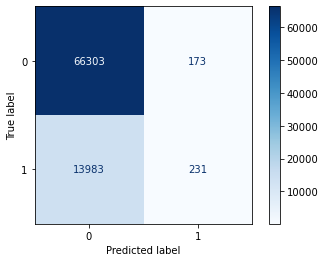

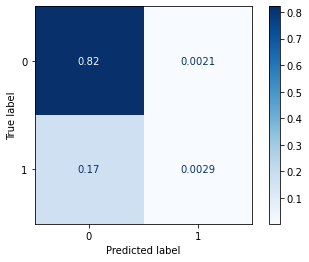

In [57]:
print_warning('Uncalibrated')
uncalibrated_confusion_matrix = confusion_matrix(target_test,test_predictions,sample_weight=input_test['weight'])
ConfusionMatrixDisplay(uncalibrated_confusion_matrix).plot(cmap=plot.cm.Blues,values_format=".0f")
uncalibrated_confusion_matrix = confusion_matrix(target_test,test_predictions,sample_weight=input_test['weight'],normalize="all")
ConfusionMatrixDisplay(uncalibrated_confusion_matrix).plot(cmap=plot.cm.Blues)

[[48619.6629912  17855.69128773]
 [ 5011.03022359  9202.49500952]]


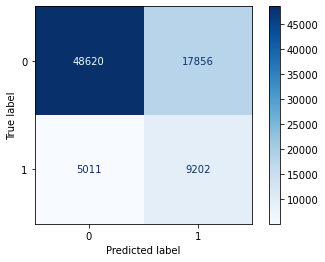

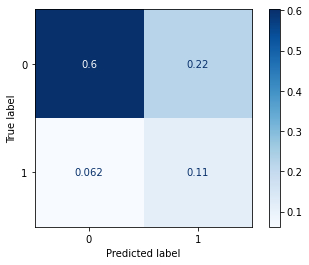

In [59]:
print_info('Calibrated with Plott Scaling')
calibrated_confusion_matrix = confusion_matrix(target_test,platt_test_predictions,sample_weight=input_test['weight'])
ConfusionMatrixDisplay(calibrated_confusion_matrix).plot(cmap=plot.cm.Blues,values_format=".0f")
calibrated_confusion_matrix = confusion_matrix(target_test,platt_test_predictions,sample_weight=input_test['weight'],normalize="all")
ConfusionMatrixDisplay(calibrated_confusion_matrix).plot(cmap=plot.cm.Blues)